# Assignment 6:
### รหัสนักศึกษา: 65130701717
### ชื่อ-นามสกุล: RATTAWIT PATTARACHAROENPONG
### หลักสูตร: SED

In [11]:
#for creating nn + loading dataset 
import tensorflow as tf
from tensorflow import  keras
from tensorflow.keras import layers

#utilities
import numpy as np
import matplotlib.pyplot as plt

#for evaluation
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

## R G B และ Color Threshold

1. อ่าน frame ภาพจาก วิดีโอ 

In [8]:
import cv2

#### Explore Color ####
cap = cv2.VideoCapture(1)

_,frame_org = cap.read()

print('Frame size: ',frame_org.shape)

scale_percent = 40 #80 # percent of original size

width = int(frame_org.shape[1] * scale_percent / 100)
height = int(frame_org.shape[0] * scale_percent / 100)
dim = (width, height)

while True:
    _,frame_org = cap.read()
    

    # resize image
    frame = cv2.resize(frame_org, dim, interpolation = cv2.INTER_AREA)
    
    #BGR
    R = frame[:,:,2]
    G = frame[:,:,1]
    B = frame[:,:,0]

    cv2.imshow("frame",frame)
    cv2.imshow("R",R)
    cv2.imshow("G",G)
    cv2.imshow("B",B)

    key = cv2.waitKey(1) #& 0xFF
    if key == ord('q'):
        break

cap.release()  #turn off camera
cv2.destroyAllWindows()


Frame size:  (720, 1280, 3)


KeyboardInterrupt: 

2. แสดงรูป Original, R, G, B ที่ทำเอง 

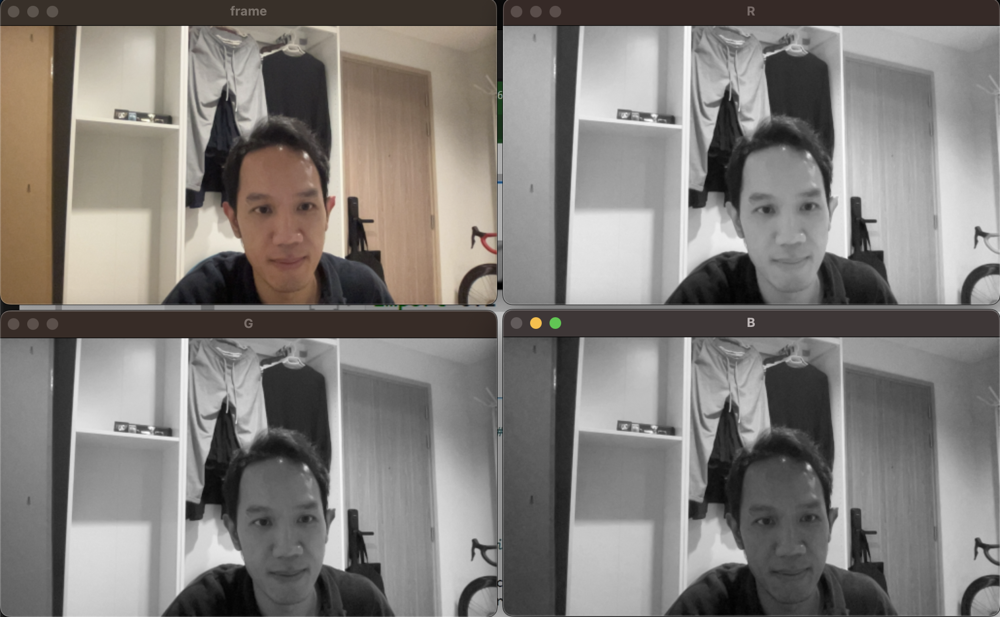

3. ตรวจจับวัตถุด้วย color threshold

In [14]:
import cv2
### Object Detection with Color Threshold ###
cap = cv2.VideoCapture(1)

_,frame_org = cap.read()
print('Frame size: ',frame_org.shape)

scale_percent = 40 # percent of original size

width = int(frame_org.shape[1] * scale_percent / 100)
height = int(frame_org.shape[0] * scale_percent / 100)
dim = (width, height)

while True:
    _,frame_org = cap.read()
    # print(frame.shape)
    
    # resize image
    frame = cv2.resize(frame_org, dim, interpolation = cv2.INTER_AREA)
    
    #BGR
    R = frame[:,:,2]
    G = frame[:,:,1]
    B = frame[:,:,0]

    cv2.imshow("frame",frame)

    # obj = (R>150) & (G<100) & (B<100)
    obj = (R<100) & (G>90) & (B<100)
    
    obj = 1.0*obj
    cv2.imshow("... Detection", obj)

    key = cv2.waitKey(1) #& 0xFF
    if key == ord('q'):
        break

cap.release()  #turn off camera
cv2.destroyAllWindows()


Frame size:  (720, 1280, 3)


KeyboardInterrupt: 

4. แสดงตัวอย่างการตรวจจับวัตถุด้วยค่าสี

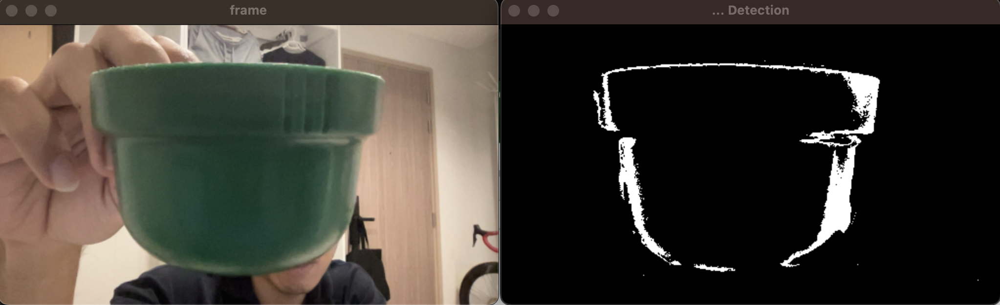

5. เขียนโปรแกรมเก็บภาพ อย่างน้อย 2 คลาส

In [1]:
import cv2
import time

cap = cv2.VideoCapture(1) 

_,frame_org = cap.read()
print('Frame size: ',frame_org.shape)

scale_percent = 50 # percent of original size

width = int(frame_org.shape[1] * scale_percent / 100)
height = int(frame_org.shape[0] * scale_percent / 100)
dim = (width, height)

while True:
    _,frame_org = cap.read()
    # print(frame.shape)
    
    # resize image
    frame = cv2.resize(frame_org, dim, interpolation = cv2.INTER_AREA)

    cv2.imshow("frame",frame)

    key = cv2.waitKey(1) #& 0xFF

    if key == ord('a'):
        timestr = time.strftime("%Y%m%d-%H%M%S")
        cv2.imwrite(filename="Images/hand/" + timestr + ".jpg", img = frame)

    if key == ord('b'):
        timestr = time.strftime("%Y%m%d-%H%M%S")
        cv2.imwrite(filename="Images/nohand/" + timestr + ".jpg", img = frame)

    if key == ord('q'):
        break

cap.release() 
cv2.destroyAllWindows()



Frame size:  (720, 1280, 3)


KeyboardInterrupt: 

6. แสดงตัวอย่างภาพที่อยู่ใน โฟลเดอร์แต่ละคลาส

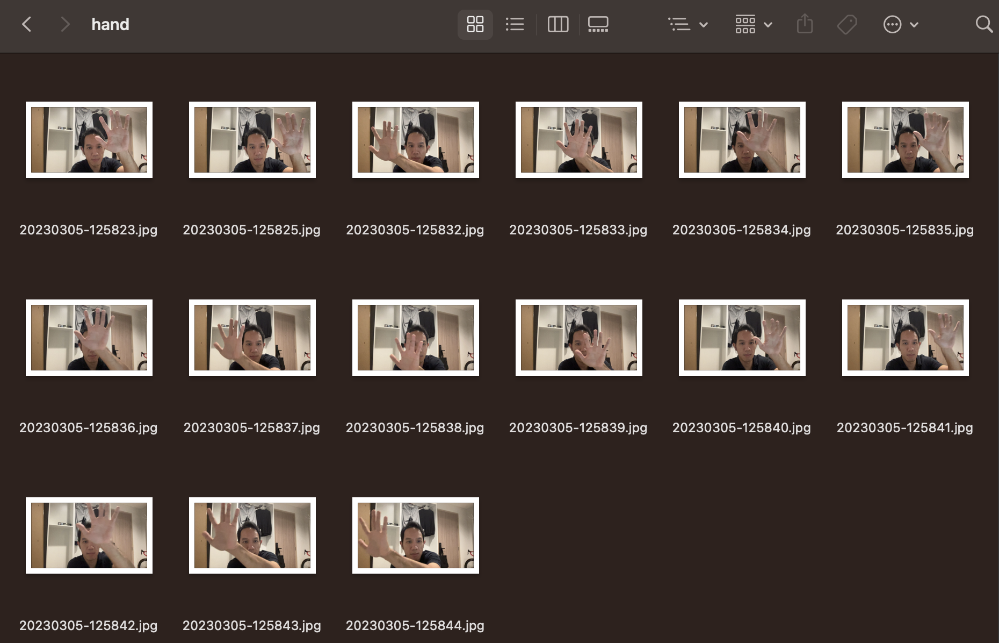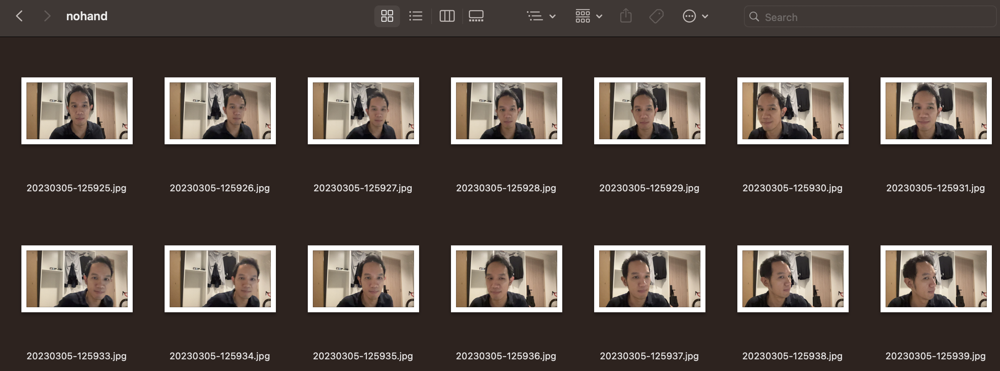

## CNN pre-trained

1. สร้างชุดข้อมูลภาพจากโฟลเดอร์ โดยมีการ label ตามโครงสร้างโฟลเดอร์ ด้วยการกำหนด labels='inferred'

In [2]:
#https://keras.io/api/data_loading/image/
import tensorflow as tf
from tensorflow import  keras
from tensorflow.keras import layers

train_ds = keras.utils.image_dataset_from_directory(
    directory= 'Images/train',  #'data/train', #'Images/train/',
    labels='inferred',
    label_mode='categorical',
    batch_size=32,
    image_size=(224, 224))

test_ds = keras.utils.image_dataset_from_directory(
    directory= 'Images/test',  # 'data/test',   #'Images/test/',
    labels='inferred',
    label_mode='categorical',
    batch_size=32,
    image_size=(224, 224))



Found 58 files belonging to 2 classes.
Metal device set to: Apple M2

systemMemory: 16.00 GB
maxCacheSize: 5.33 GB

Found 8 files belonging to 2 classes.


2023-03-05 14:36:15.811192: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-03-05 14:36:15.811700: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


2. แสดงชื่อคลาส

In [3]:
class_names = train_ds.class_names
print(class_names)

['hand', 'nohand']


3. สร้างชั้น CNN  โดยใช้ package VGG16 กำหนด ดังนี้ 
- ไม่เอาชั้น fully connected nn โดยกำหนด include_top=False
- weights='imagenet'
- input_shape=(224,224,3)




In [4]:
from tensorflow.keras.applications.vgg16 import VGG16  #https://keras.io/api/applications/vgg/
import numpy as np

base = VGG16(include_top=False, weights='imagenet', input_shape=(224,224,3))

4. เขียนโค้ดแสดงโครงสร้างของ base model ในข้อ 3


In [5]:
base.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

5. กำหนดให้ไม่ต้องมีการปรับค่า weight ของ base model

In [6]:
base.trainable = False

6. กำหนดโครงสร้างของโมเดล สำหรับสอนข้อมูลภาพที่เราสร้างไว้ 

In [7]:
model = keras.Sequential()
model.add(base)
model.add(layers.Flatten())
model.add(layers.Dense(2, activation='softmax'))
model.summary() 

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten (Flatten)           (None, 25088)             0         
                                                                 
 dense (Dense)               (None, 2)                 50178     
                                                                 
Total params: 14,764,866
Trainable params: 50,178
Non-trainable params: 14,714,688
_________________________________________________________________


7. กำหนดรูปแบบ การเรียนรู้ 
- loss='categorical_crossentropy' 
- optimizer='adam'
- metrics=['accuracy']

In [8]:
model.compile(loss='categorical_crossentropy', optimizer='adam',metrics=['accuracy'])

8. ให้โมเดลเรียนรู้จากข้อมูลสอน จำนวนอย่างน้อย 10 รอบ และกำหนด validation_data=test_ds

In [9]:
model.fit(train_ds, epochs=10, validation_data=test_ds)

Epoch 1/10


2023-03-05 14:36:51.757165: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2023-03-05 14:36:51.761952: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


2/2 [==============================] - 2s 691ms/step - loss: 7.5334 - accuracy: 0.6379 - val_loss: 48.9342 - val_accuracy: 0.5000
Epoch 2/10


2023-03-05 14:36:53.024907: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


2/2 [==============================] - 1s 426ms/step - loss: 5.1245 - accuracy: 0.8793 - val_loss: 26.1659 - val_accuracy: 0.5000
Epoch 3/10
2/2 [==============================] - 1s 409ms/step - loss: 0.4051 - accuracy: 0.9655 - val_loss: 0.1551 - val_accuracy: 0.8750
Epoch 4/10
2/2 [==============================] - 1s 410ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Epoch 5/10
2/2 [==============================] - 1s 408ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Epoch 6/10
2/2 [==============================] - 1s 408ms/step - loss: 0.0389 - accuracy: 0.9828 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Epoch 7/10
2/2 [==============================] - 1s 409ms/step - loss: 4.2882e-06 - accuracy: 1.0000 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Epoch 8/10
2/2 [==============================] - 1s 412ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0000e+00 - val_accuracy: 1

9. แสดงประสิทธภาพโมเดลแต่ละรอบ

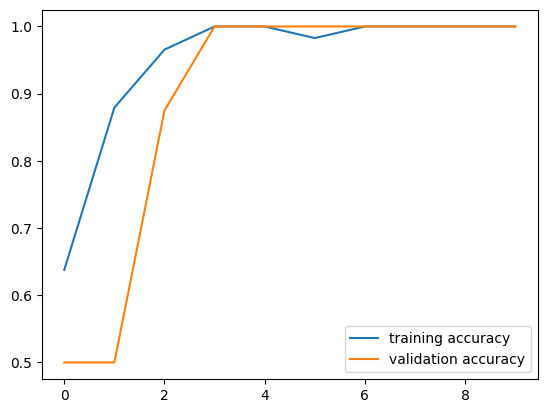

In [12]:
plt.plot(model.history.history['accuracy'], label='training accuracy')
plt.plot(model.history.history['val_accuracy'], label='validation accuracy')
# plt.plot(model.history.history['loss'], label='training loss')
# plt.plot(model.history.history['val_loss'], label='validation loss')
plt.legend()
plt.show()

9. บันทึก model ชื่อ 6xxxxxxx_model.h5

In [14]:
model.save('65130701717_model_hand_yes_no.h5')

: 

## Apply model to video

- Kernel -> Restart Kernel เพื่อทดสอบการนำไปใช้โมเดล โดยไม่ใข้ค่าเก่าที่รันมา

1. load model ที่บันทึกไว้

In [1]:
from keras.models import load_model
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

# model = load_model('6xxxxxxx_model.h5')
model = load_model('65130701717_model_hand_yes_no.h5')

class_names = ['hand', 'nohand'] #['non-vehicles', 'vehicles'] # ['dislike', 'like']


Metal device set to: Apple M2

systemMemory: 16.00 GB
maxCacheSize: 5.33 GB



2023-03-05 14:13:58.048796: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-03-05 14:13:58.048888: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


2. อ่านภาพ และทำนาย ภาพ ว่าอยู่คลาสใด

In [4]:

import cv2

im = cv2.imread('Images/test/hand/20230305-125823.jpg')


imrz = cv2.resize(im,(224,224))

im_arr = tf.keras.utils.img_to_array(imrz)

im_arr = np.array([im_arr])  # Convert single image to a batch.

predictions = model.predict(im_arr)
str_class = class_names[predictions.argmax()]
print('Class: ', str_class)

#ปรับแต่งเอง
image = cv2.putText(im,str_class,(50, 70), cv2.FONT_HERSHEY_SIMPLEX, 3, (0, 255, 0), 2, cv2.LINE_AA)

cv2.imshow("image", image)
cv2.waitKey()



2023-03-05 14:08:37.387801: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2023-03-05 14:08:37.438502: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 556ms/step
Class:  hand


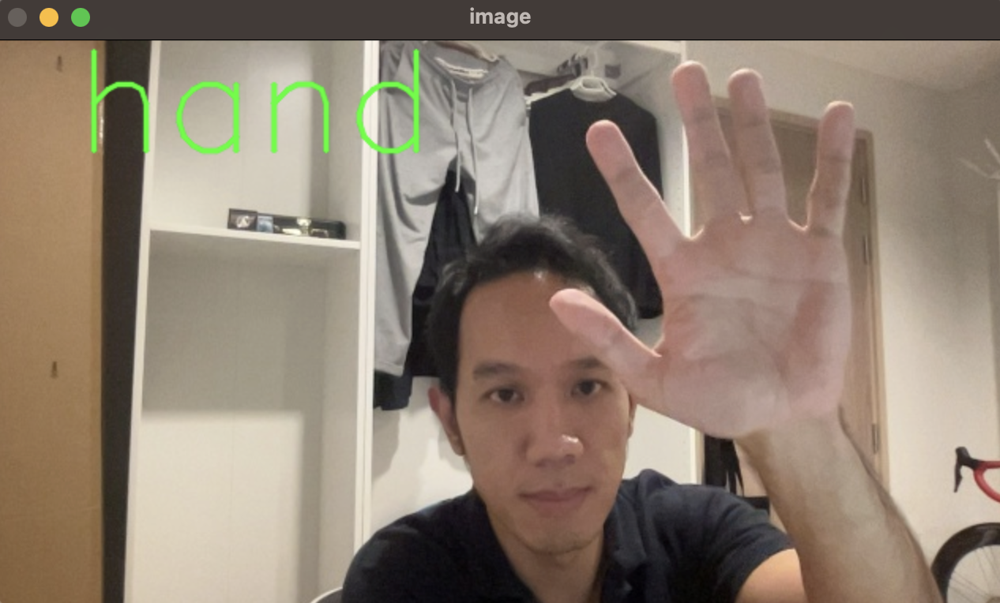

3. อ่านภาพจากเฟรมวิดีโอและทำนาย

In [7]:
import cv2
# cap = cv2.VideoCapture(0)
# cap = cv2.VideoCapture('road.mp4')
cap = cv2.VideoCapture(1)

_,frame_org = cap.read()
print('Frame size: ',frame_org.shape)

scale_percent = 80 # 20 # percent of original size

width = int(frame_org.shape[1] * scale_percent / 100)
height = int(frame_org.shape[0] * scale_percent / 100)
dim = (width, height)

while True:
    _,frame_org = cap.read()
    print(frame_org.shape)
    
    # resize image
    frame = cv2.resize(frame_org, dim, interpolation = cv2.INTER_AREA)
    
    im = cv2.resize(frame,(224,224))
   
    predictions = model.predict(np.array([im])) 
    
    str_class = class_names[predictions.argmax()]
        
    image = cv2.putText(frame,str_class,(50, 70), cv2.FONT_HERSHEY_SIMPLEX, 3, (0, 255, 0), 2, cv2.LINE_AA)
    
    cv2.imshow("frame",image)

    key = cv2.waitKey(1) #& 0xFF
    if key == ord('q'):
        break

cv2.destroyAllWindows()


Frame size:  (720, 1280, 3)
(720, 1280, 3)
1/1 [==============================] - 0s 13ms/step
(720, 1280, 3)
1/1 [==============================] - 0s 10ms/step
(720, 1280, 3)
1/1 [==============================] - 0s 11ms/step
(720, 1280, 3)
1/1 [==============================] - 0s 11ms/step
(720, 1280, 3)
1/1 [==============================] - 0s 11ms/step
(720, 1280, 3)
1/1 [==============================] - 0s 10ms/step
(720, 1280, 3)
1/1 [==============================] - 0s 10ms/step
(720, 1280, 3)
1/1 [==============================] - 0s 10ms/step
(720, 1280, 3)
1/1 [==============================] - 0s 10ms/step
(720, 1280, 3)
1/1 [==============================] - 0s 10ms/step
(720, 1280, 3)
1/1 [==============================] - 0s 11ms/step
(720, 1280, 3)
1/1 [==============================] - 0s 10ms/step
(720, 1280, 3)
1/1 [==============================] - 0s 10ms/step
(720, 1280, 3)
1/1 [==============================] - 0s 10ms/step
(720, 1280, 3)
1/1 [==============

KeyboardInterrupt: 

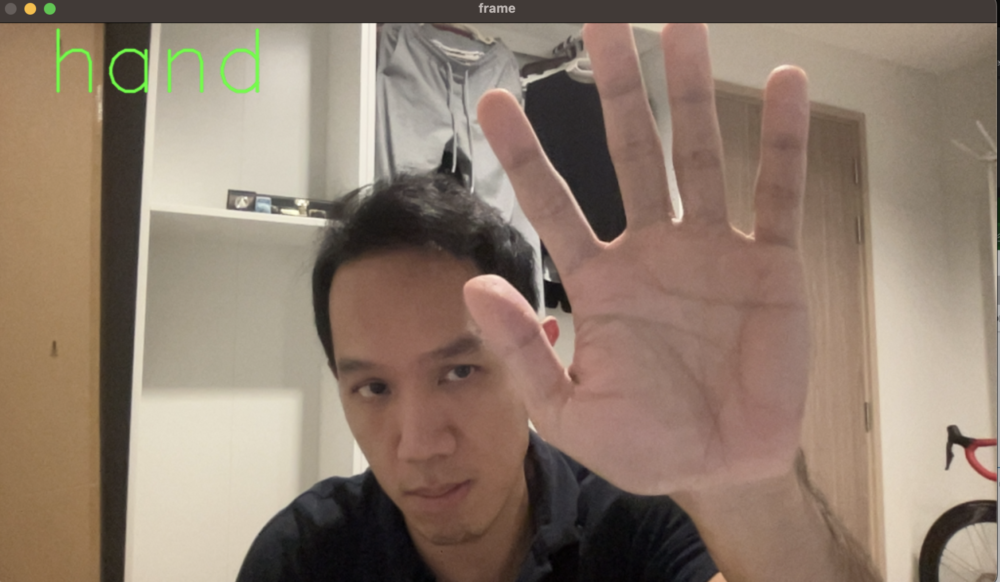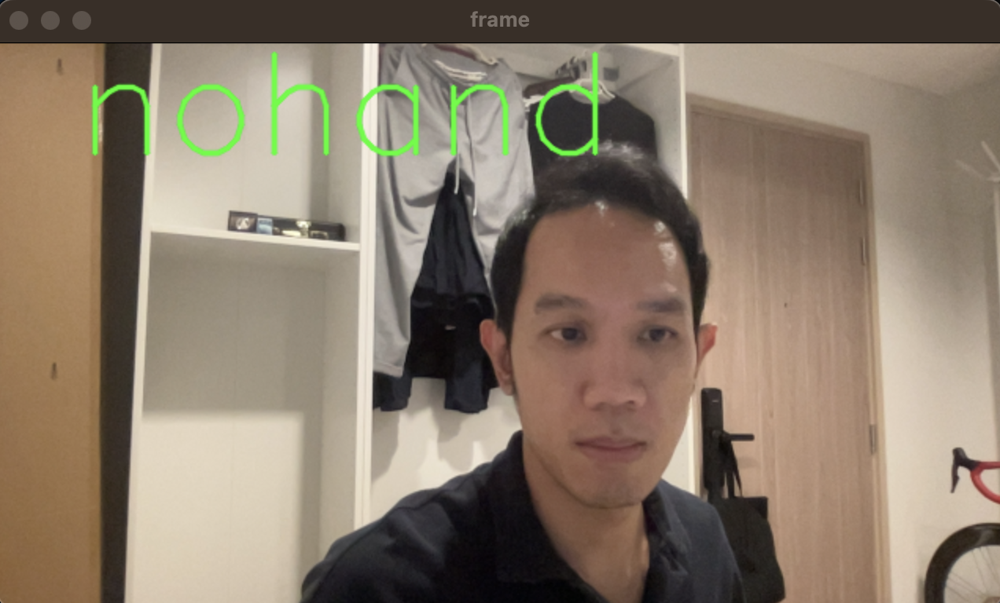

4. สร้างไฟล์ 65xxxx_RunModel.py โดยประกอบด้วย ข้อ 1 และ 3 


In [8]:
%%writefile 65130701717_RunModel.py 
from keras.models import load_model
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import cv2
model = load_model('65130701717_model_hand_yes_no.h5')

class_names = ['hand', 'nohand']

cap = cv2.VideoCapture(1)

_,frame_org = cap.read()
print('Frame size: ',frame_org.shape)

scale_percent = 80 # 20 # percent of original size

width = int(frame_org.shape[1] * scale_percent / 100)
height = int(frame_org.shape[0] * scale_percent / 100)
dim = (width, height)

while True:
    _,frame_org = cap.read()
    print(frame_org.shape)
    
    # resize image
    frame = cv2.resize(frame_org, dim, interpolation = cv2.INTER_AREA)
    
    im = cv2.resize(frame,(224,224))
   
    predictions = model.predict(np.array([im])) 
    
    str_class = class_names[predictions.argmax()]
        
    image = cv2.putText(frame,str_class,(50, 70), cv2.FONT_HERSHEY_SIMPLEX, 3, (0, 255, 0), 2, cv2.LINE_AA)
    
    cv2.imshow("frame",image)

    key = cv2.waitKey(1) #& 0xFF
    if key == ord('q'):
        break

cv2.destroyAllWindows()

Writing 65130701717_RunModel.py


: 

5. เปิด Command Prompt หรือ Terminal หรือ Power Shell แล้วรันไฟล์ .py 

เช่น 

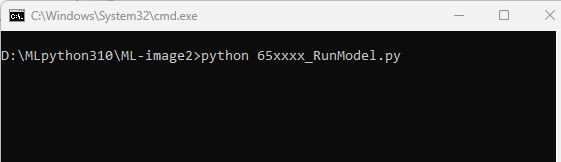


ข้อ 5 ให้บันทึกหน้าจอ การรันและผล แล้วแชร์ลิงค์วิดีโอบันทึกหน้าจอผลการรันมาส่ง 


***ส่งลิงค์วิดีโอ: https://mailkmuttacth.sharepoint.com/:v:/s/MACHINELEARNING395/Ef_AIbXIwxxMuPELfiqP_7ABFijCj2tQXNVpo8Uh0tSoOA?email=niwan.watt%40kmutt.ac.th&e=AfqJwi

6. ส่งไฟล์ LEB2 ดังนี้ 
* Ass6-65xxx.ipynb
* 6xxxx_model.h5
* 6xxxx_RunModel.py